In [ ]:
!pip install imageio

     |████████████████████████████████| 3.3 MB 3.9 MB/s eta 0:00:01
You should consider upgrading via the '/home/charly/.venv/bin/python -m pip install --upgrade pip' command.


In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals

try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass


In [2]:
import tensorflow as tf
tf.__version__

'2.3.0'

In [3]:
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras import layers
import time


In [4]:

(train_images, _), (_, _) = tf.keras.datasets.mnist.load_data()

train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')

train_images = (train_images - 127.5) / 127.5 

BUFFER_SIZE = 60000
BATCH_SIZE = 256
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

11493376/11490434 [==============================] - 0s 0us/step


## Modelos

### Generador

In [5]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))

    model.add(layers.Reshape((7, 7, 256)))

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.01))

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(1, 1), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.01))

    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', activation='tanh'))

    return model

In [6]:
generator = make_generator_model()

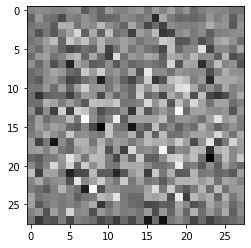

In [7]:
noise_dim = 100
noise = tf.random.normal([1, noise_dim])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')

### Discriminador

In [8]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(32, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(layers.LeakyReLU(alpha=0.01))
    
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.01))
    
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.01))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))

    return model



In [9]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

discriminator.summary ()

tf.Tensor([[0.49953172]], shape=(1, 1), dtype=float32)
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 14, 14, 32)        832       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 7, 7, 64)          51264     
_________________________________________________________________
batch_normalization_2 (Batch (None, 7, 7, 64)          256       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 7, 7, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 4, 4, 128)         204928    
_________________________________________________________________

## Funciones de *Loss* y optimizadores


In [10]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### Discriminator loss

In [11]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

### Generator loss

In [12]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

### Optimizadores

In [13]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)

discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

## Entrenamiento

###Training step



In [14]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

### Training loop

In [15]:
grid_size_x= 10
grid_size_y= 10
seed = tf.random.normal([grid_size_x*grid_size_y , noise_dim])

def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    generate_images(generator,seed)
    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  generate_images(generator, seed)

### Visualización de las imagenes (en realidad solo las que genera el Generador para ver que va aprendiendo)



In [16]:

def generate_images(model, test_input):
  
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(grid_size_x,grid_size_y))
  for i in range(predictions.shape[0]):
      plt.subplot(grid_size_x, grid_size_y, i+1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
      plt.axis('off')            
  plt.show()

### Entrenar el model

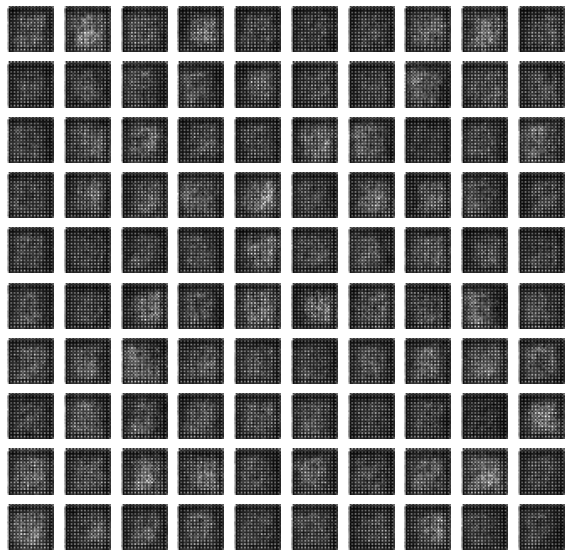

Time for epoch 1 is 16.453711986541748 sec


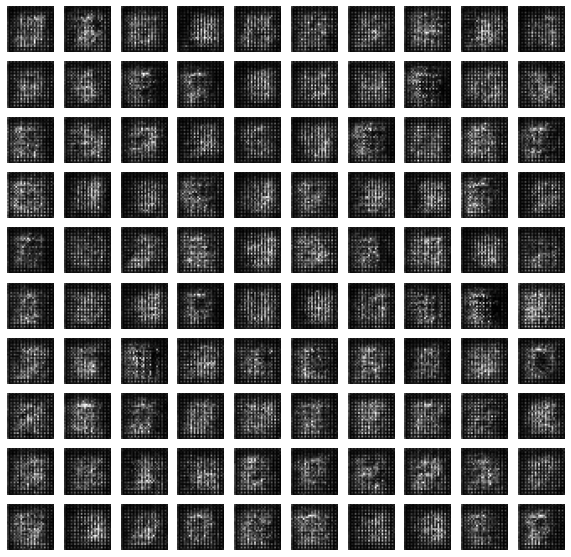

Time for epoch 2 is 14.736800909042358 sec


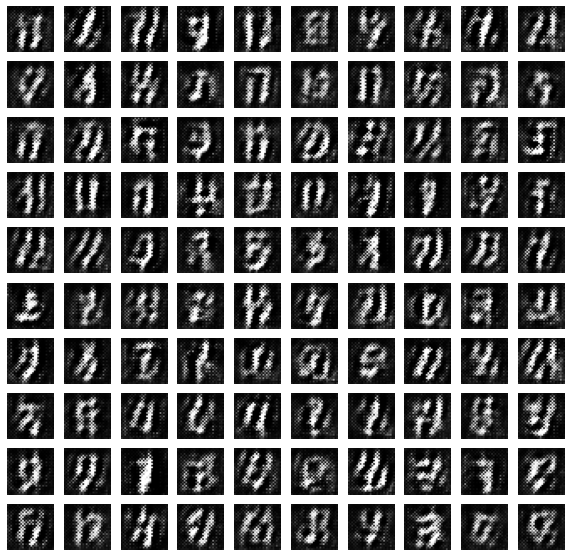

Time for epoch 3 is 14.17386531829834 sec


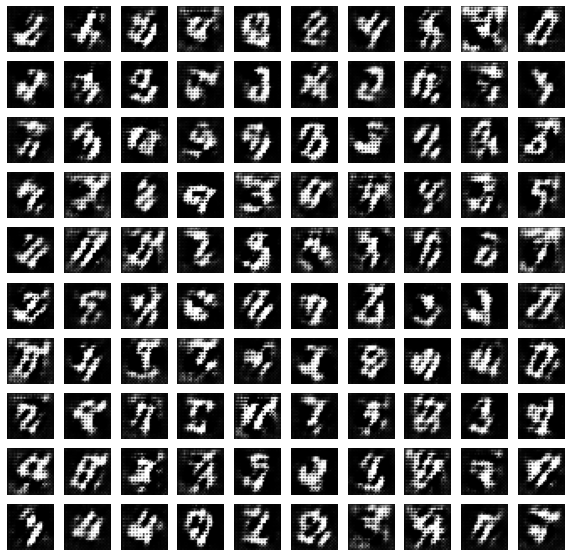

Time for epoch 4 is 14.07943081855774 sec


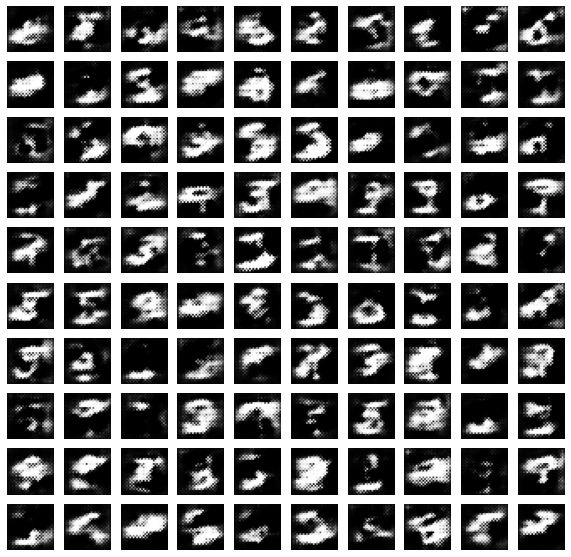

Time for epoch 5 is 14.060822010040283 sec


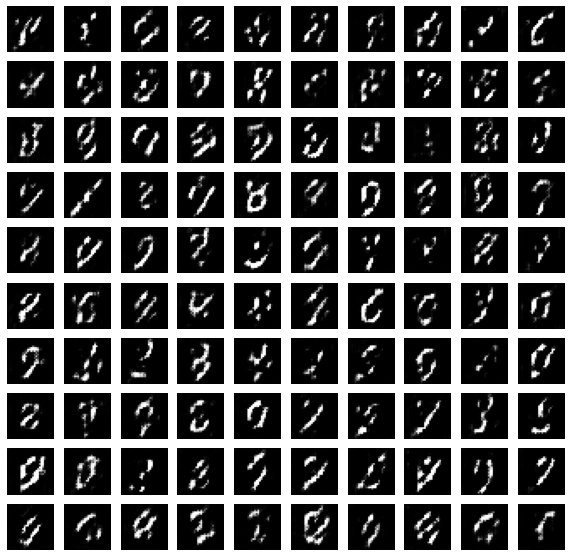

Time for epoch 6 is 13.98933482170105 sec


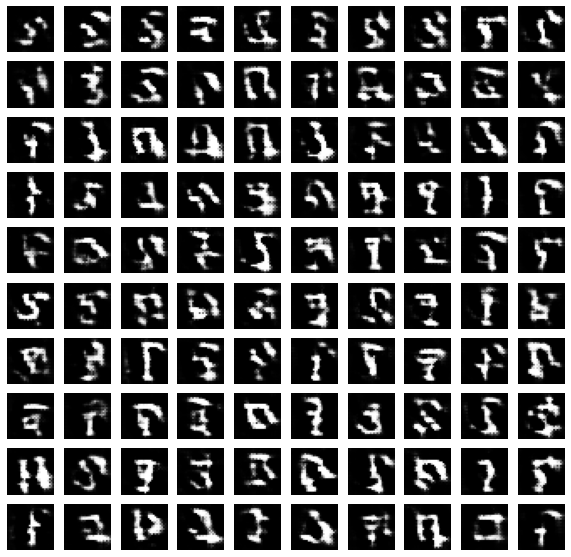

Time for epoch 7 is 14.16220998764038 sec


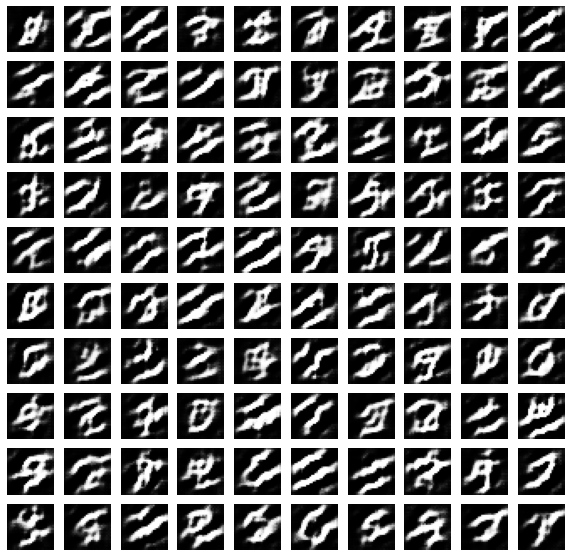

Time for epoch 8 is 14.230756282806396 sec


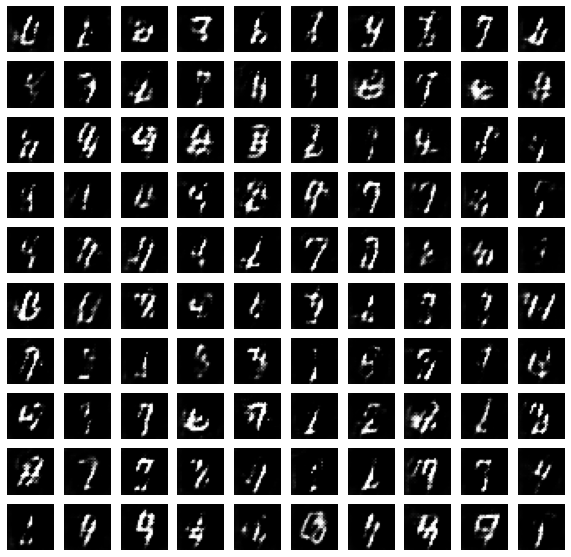

Time for epoch 9 is 14.112499952316284 sec


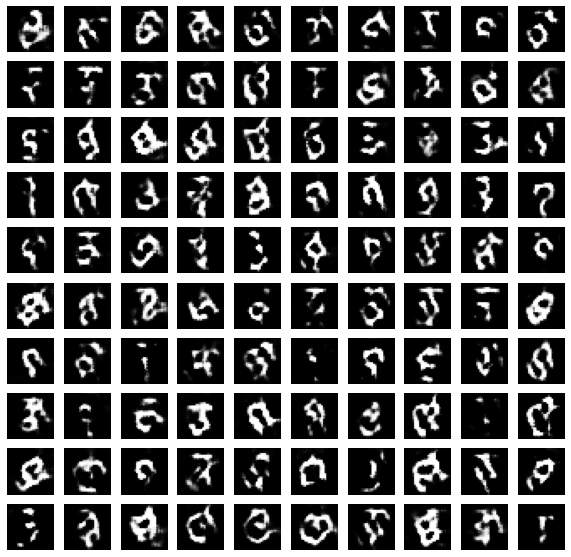

Time for epoch 10 is 14.024558782577515 sec


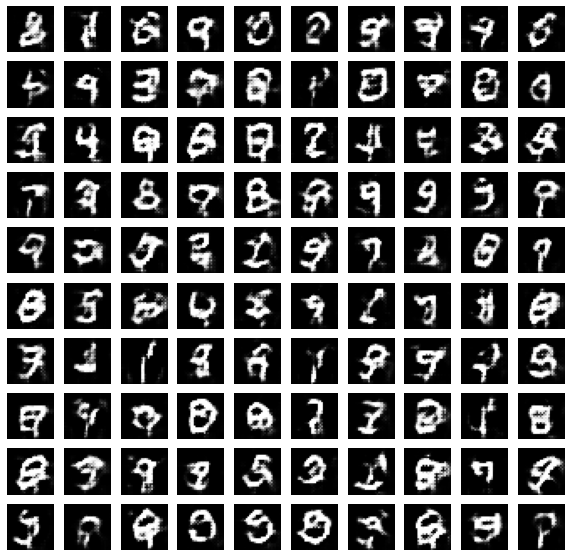

Time for epoch 11 is 14.045624256134033 sec


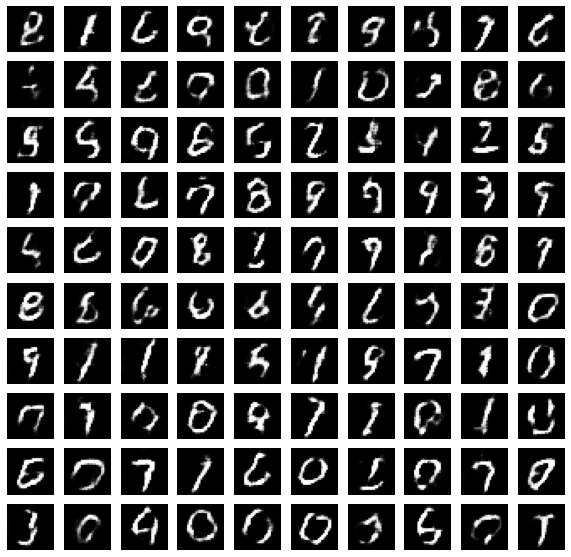

Time for epoch 12 is 14.13049578666687 sec


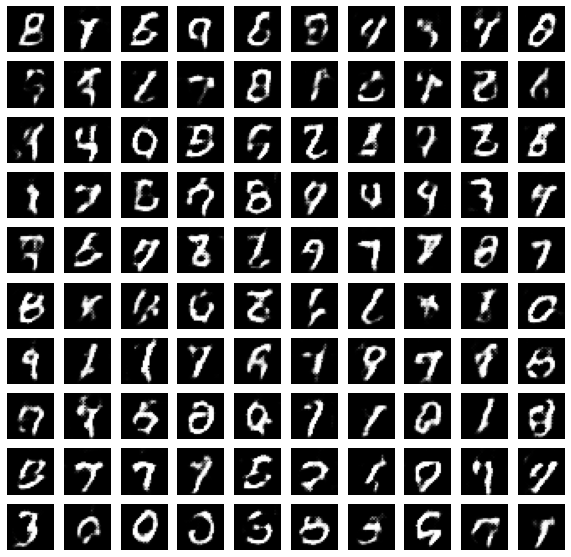

Time for epoch 13 is 13.980812549591064 sec


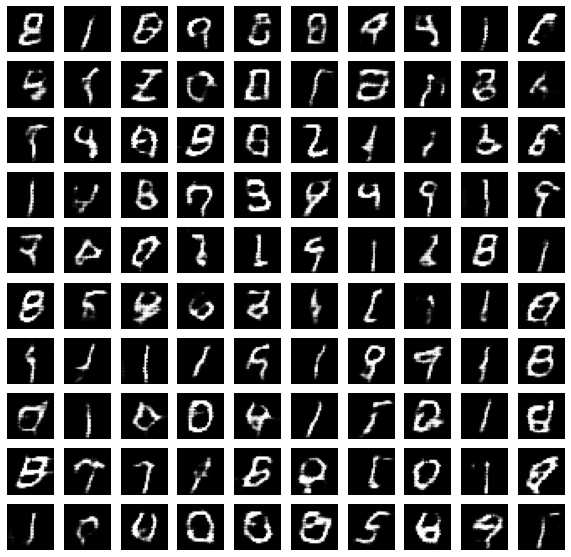

Time for epoch 14 is 14.095452547073364 sec


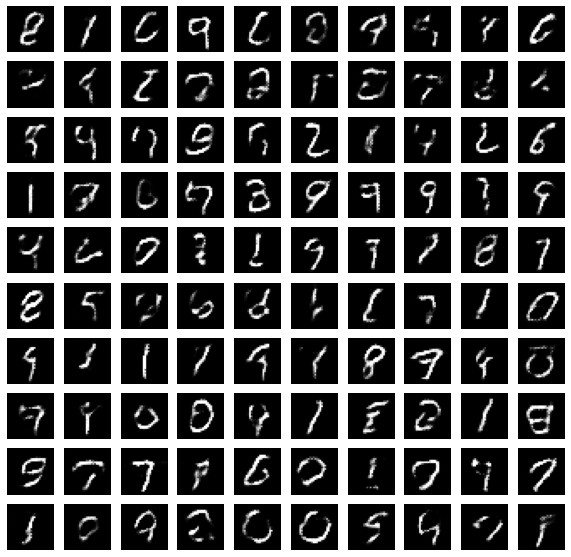

Time for epoch 15 is 14.11970329284668 sec


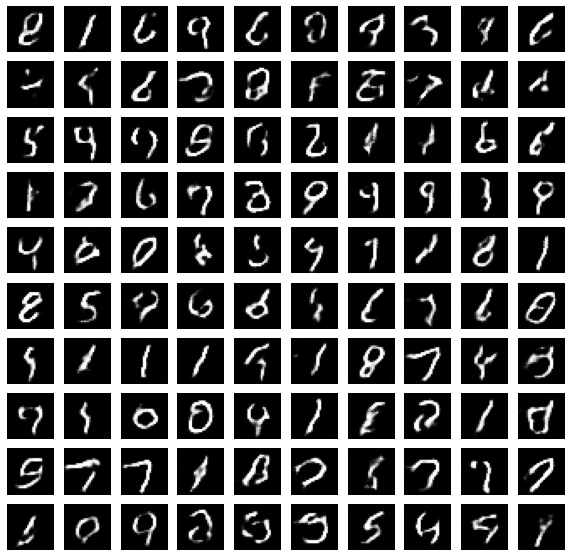

Time for epoch 16 is 13.956493854522705 sec


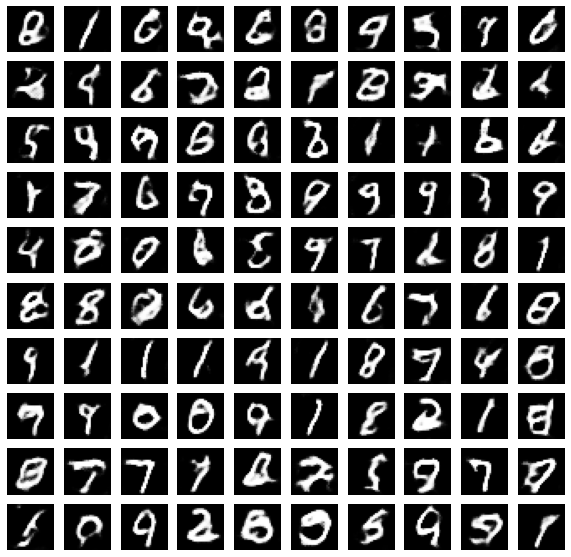

Time for epoch 17 is 14.106168508529663 sec


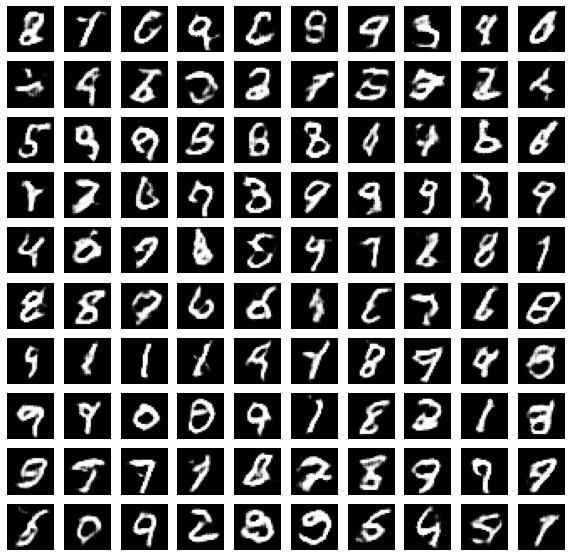

Time for epoch 18 is 14.132708072662354 sec


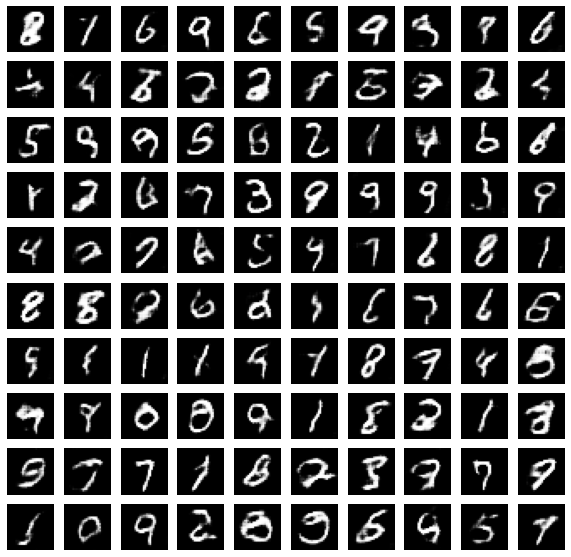

Time for epoch 19 is 13.985647201538086 sec


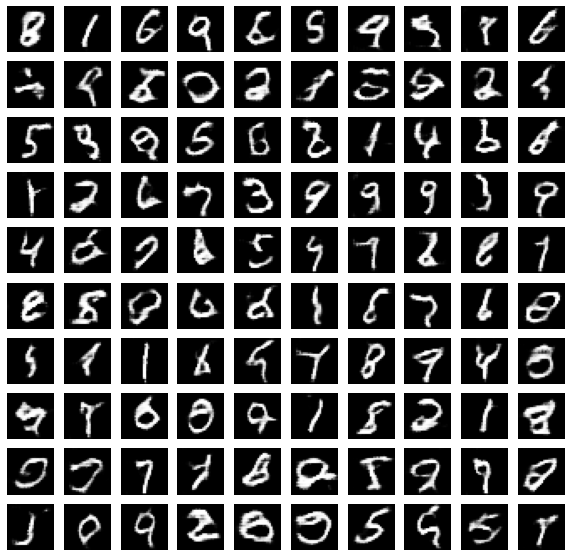

Time for epoch 20 is 14.10913872718811 sec


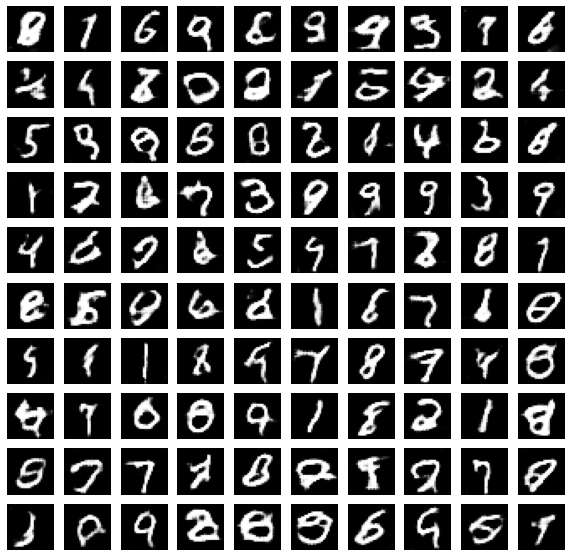

Time for epoch 21 is 14.127932071685791 sec


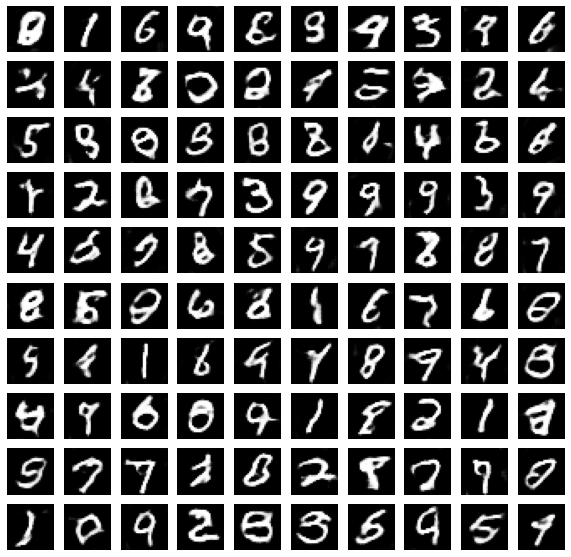

Time for epoch 22 is 13.988141059875488 sec


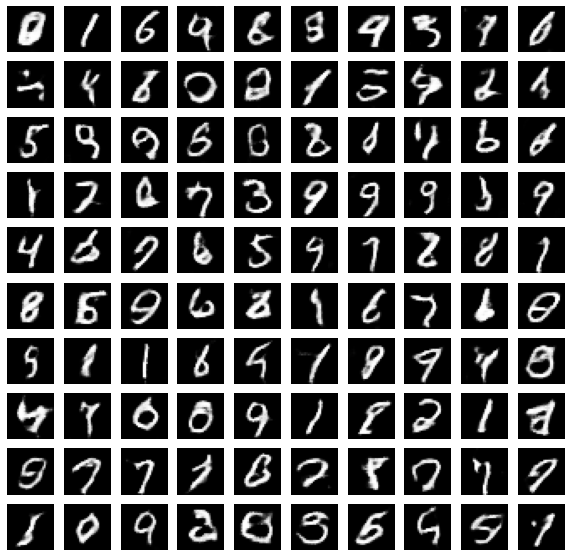

Time for epoch 23 is 14.091079950332642 sec


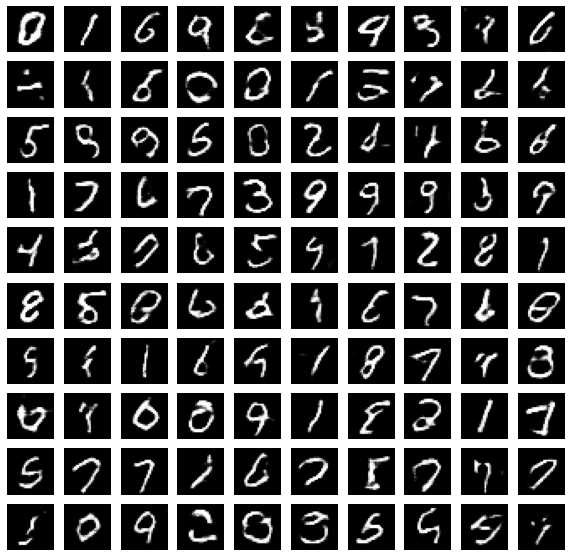

Time for epoch 24 is 14.137386322021484 sec


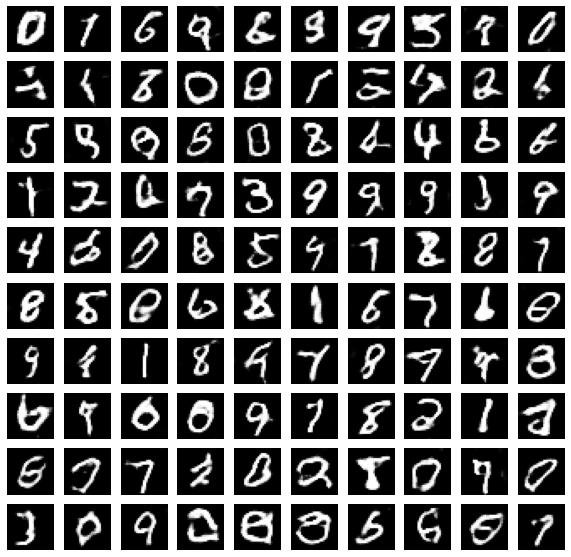

Time for epoch 25 is 13.982300281524658 sec


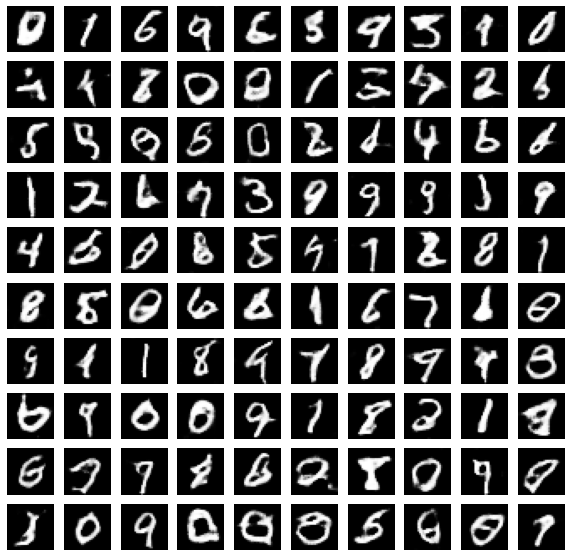

Time for epoch 26 is 14.166501760482788 sec


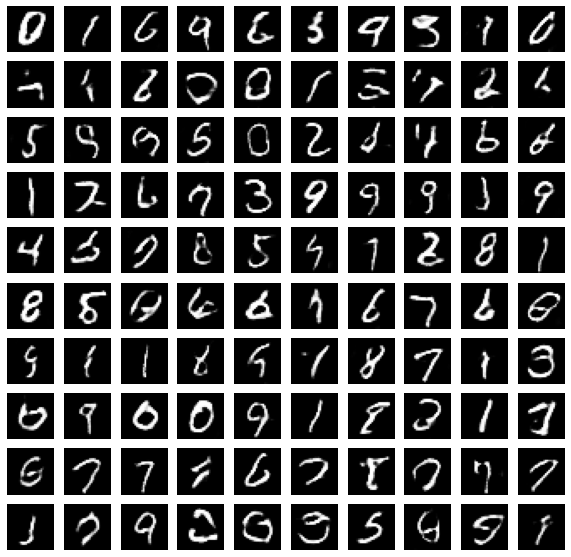

Time for epoch 27 is 14.1150381565094 sec


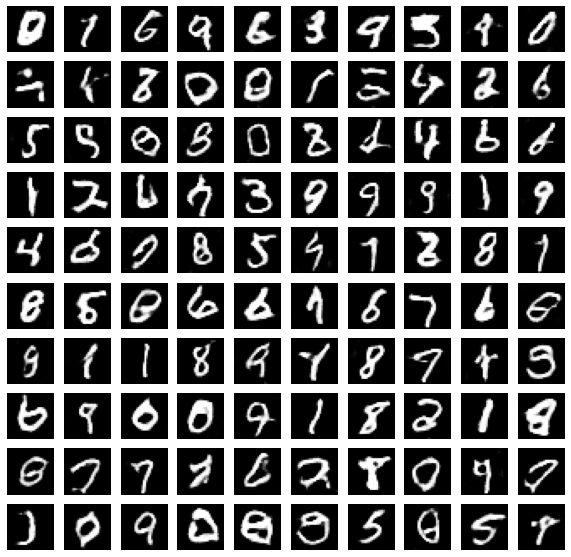

Time for epoch 28 is 13.967066764831543 sec


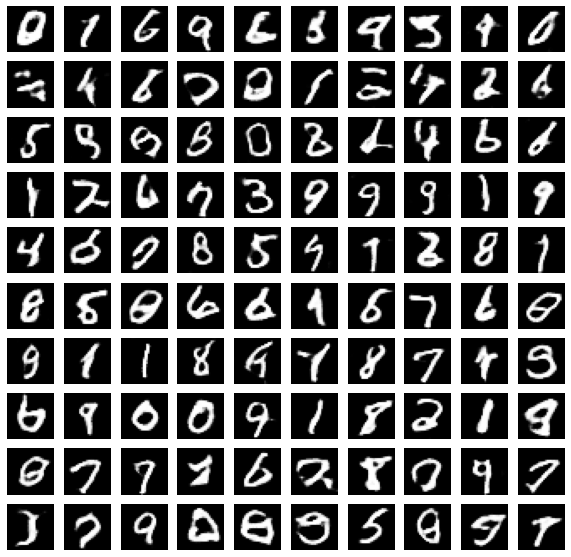

Time for epoch 29 is 14.155039072036743 sec


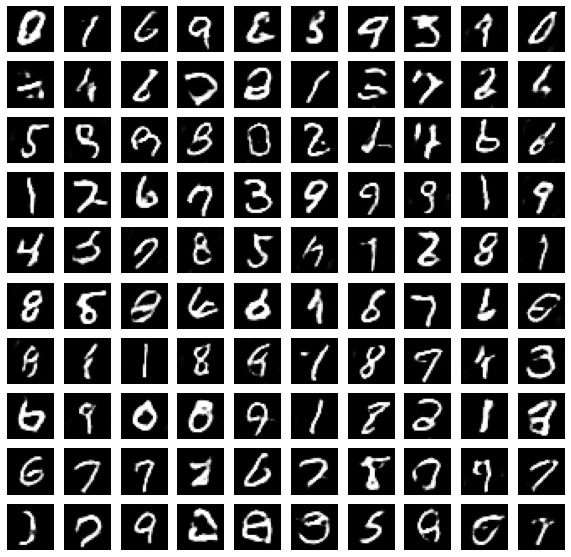

Time for epoch 30 is 14.115908145904541 sec


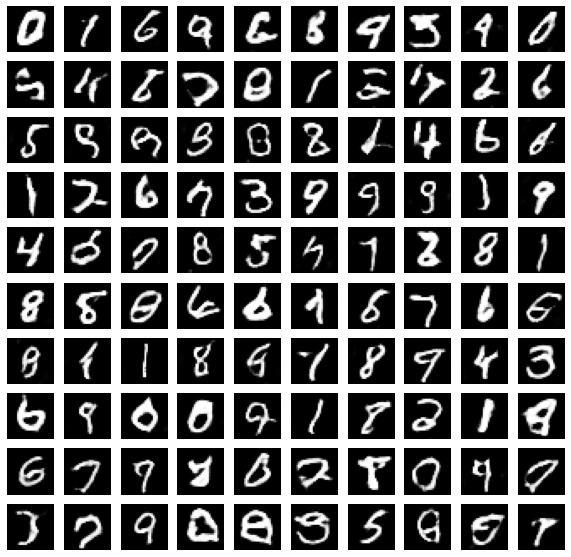

Time for epoch 31 is 13.973707675933838 sec


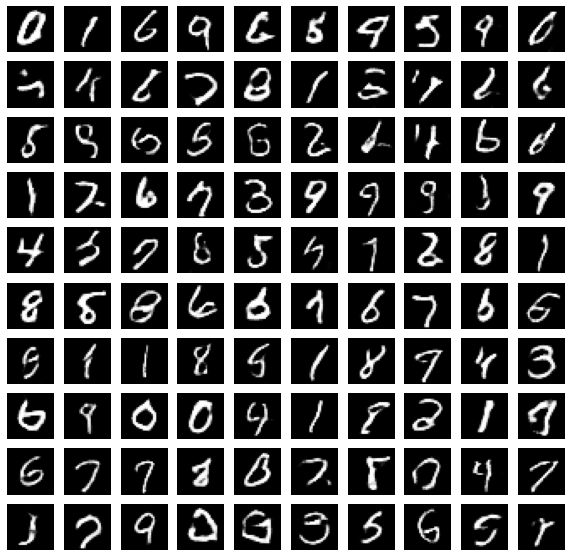

Time for epoch 32 is 14.10358715057373 sec


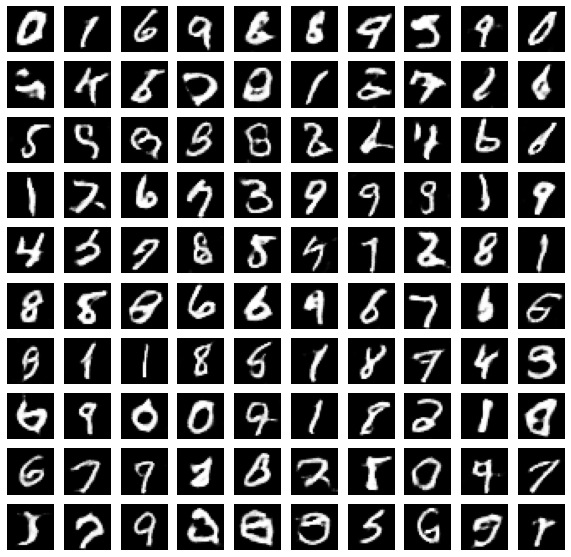

Time for epoch 33 is 14.064280271530151 sec


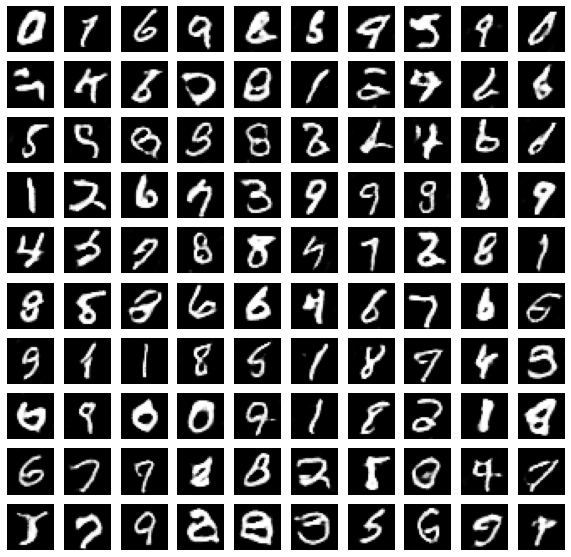

Time for epoch 34 is 13.990902185440063 sec


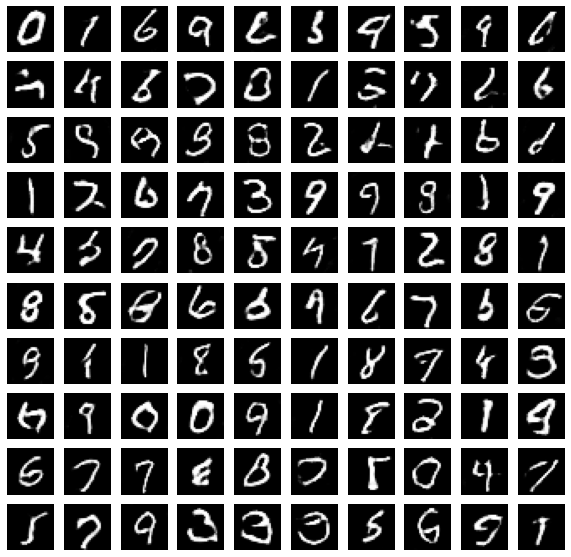

Time for epoch 35 is 14.076387166976929 sec


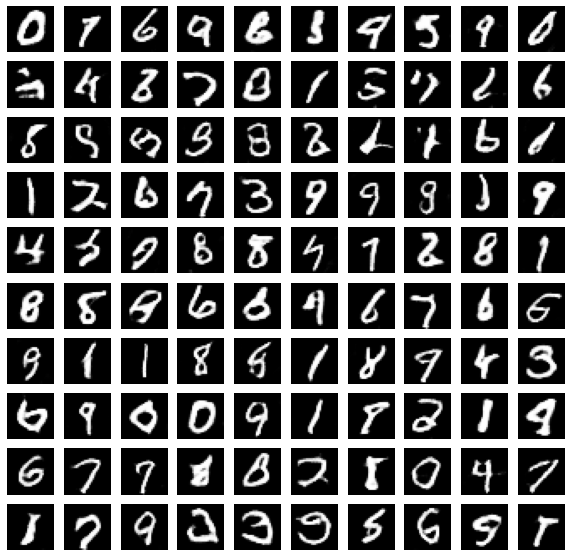

Time for epoch 36 is 14.231683254241943 sec


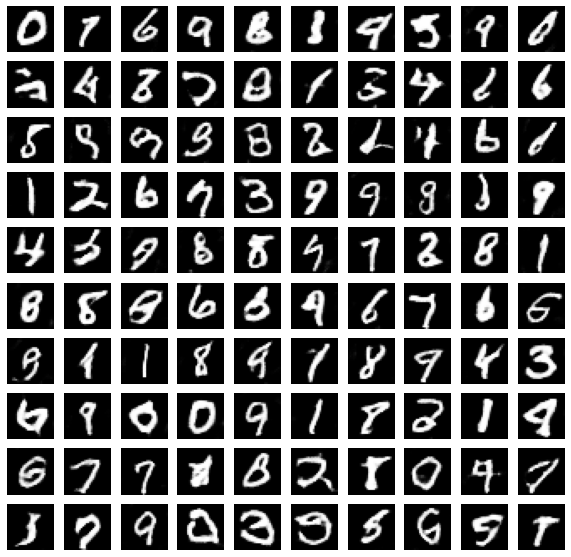

Time for epoch 37 is 13.947690963745117 sec


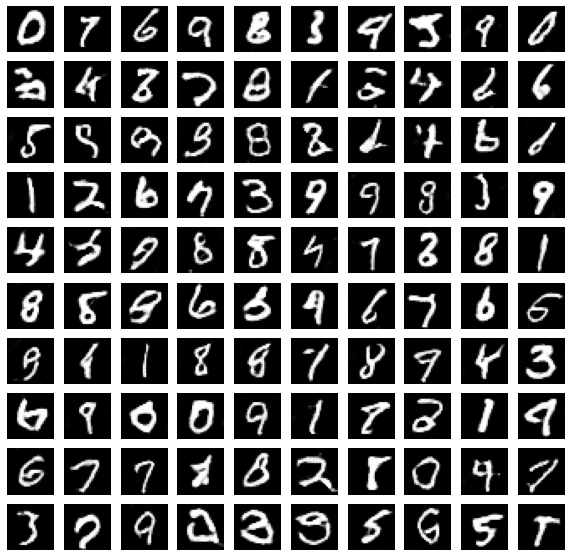

Time for epoch 38 is 14.036755323410034 sec


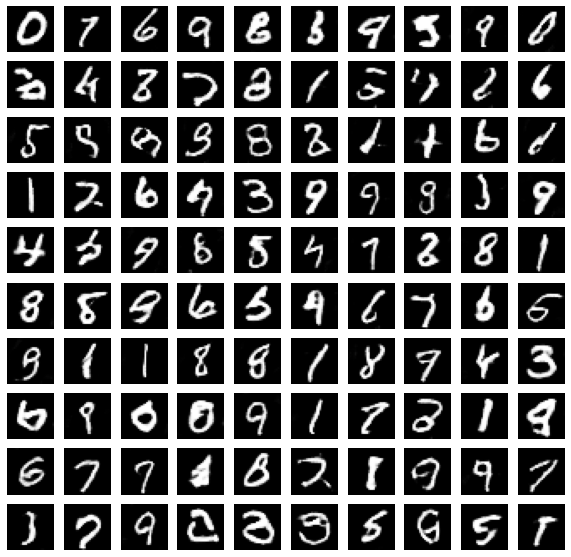

Time for epoch 39 is 14.186058521270752 sec


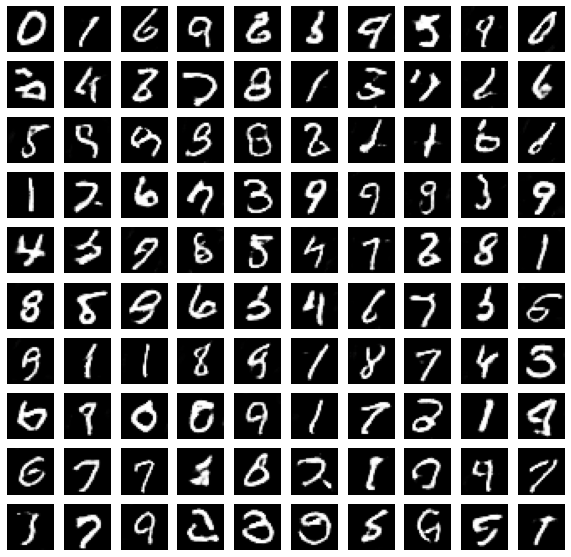

Time for epoch 40 is 13.954198360443115 sec


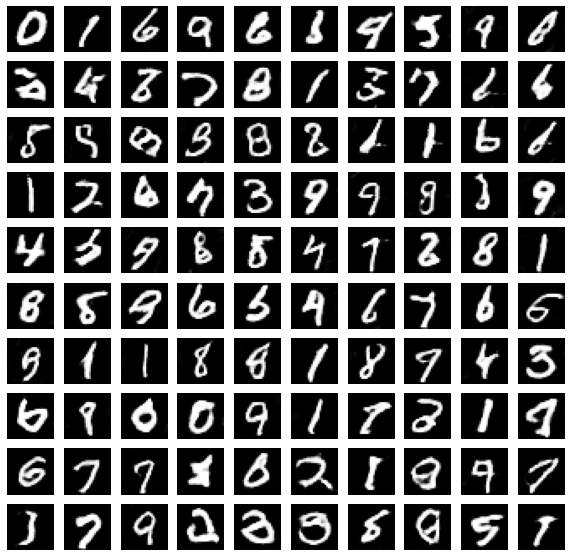

Time for epoch 41 is 14.092567443847656 sec


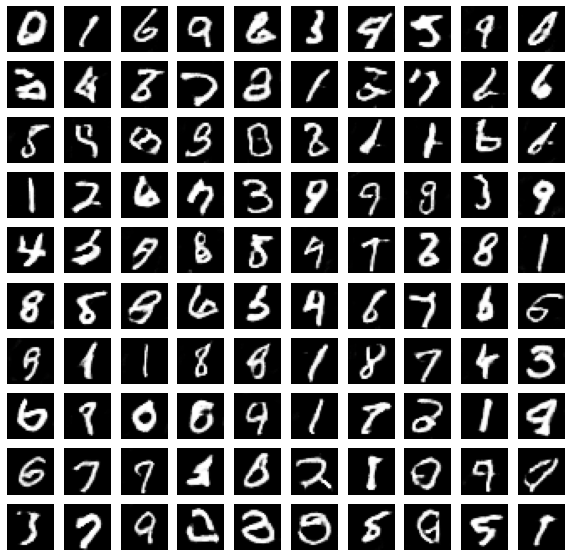

Time for epoch 42 is 14.078988313674927 sec


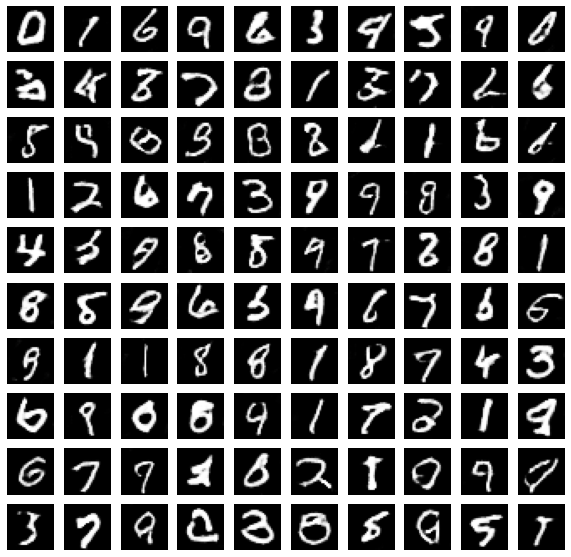

Time for epoch 43 is 13.997994422912598 sec


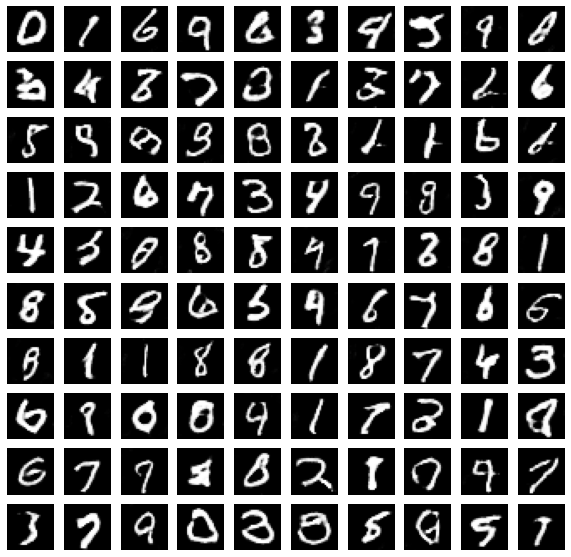

Time for epoch 44 is 14.08064341545105 sec


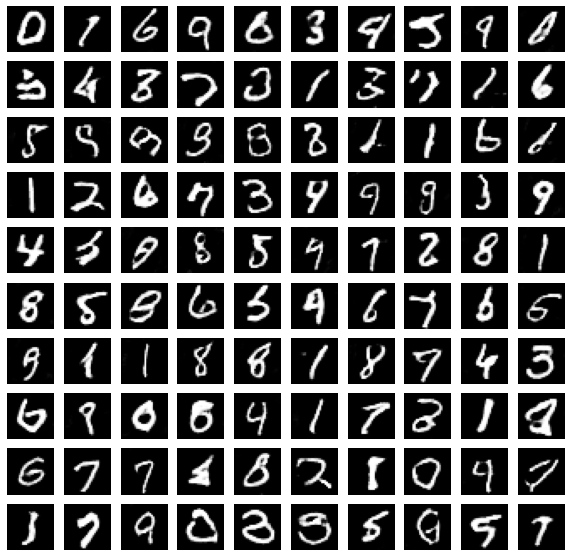

Time for epoch 45 is 14.125599384307861 sec


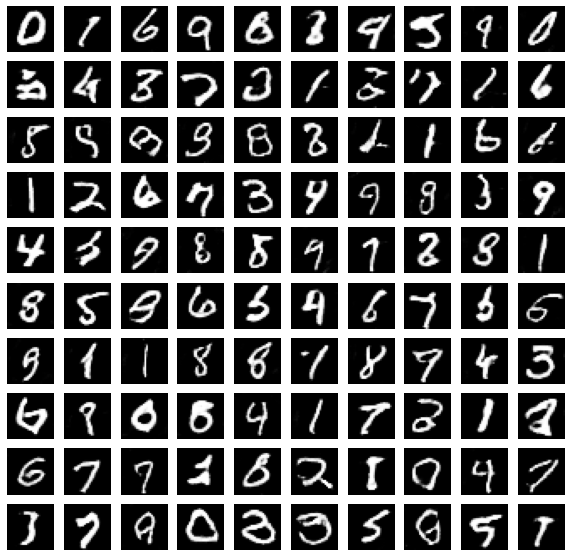

Time for epoch 46 is 13.930374145507812 sec


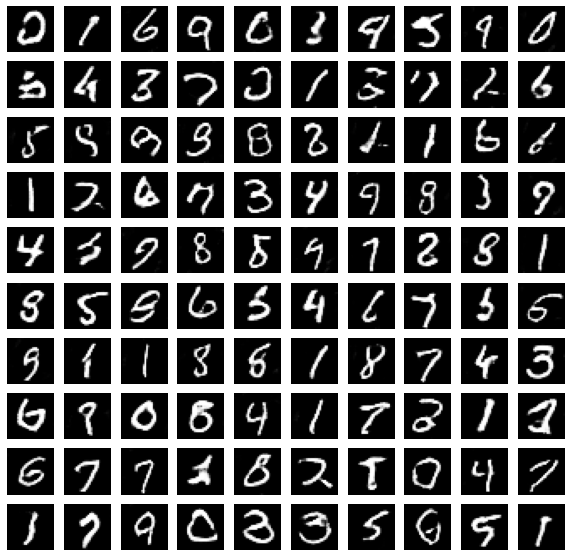

Time for epoch 47 is 14.051368474960327 sec


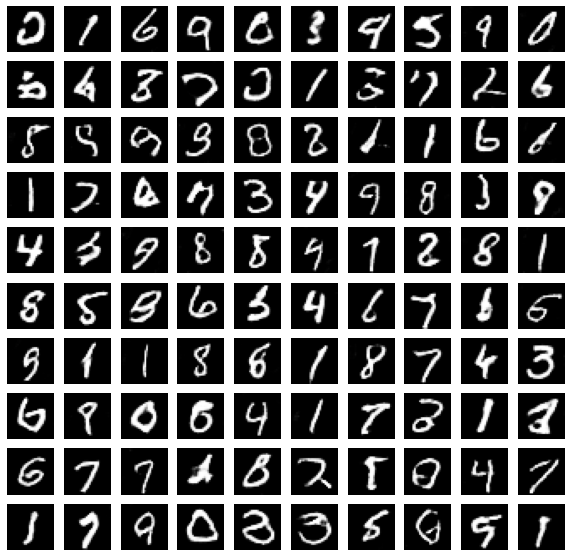

Time for epoch 48 is 14.153895139694214 sec


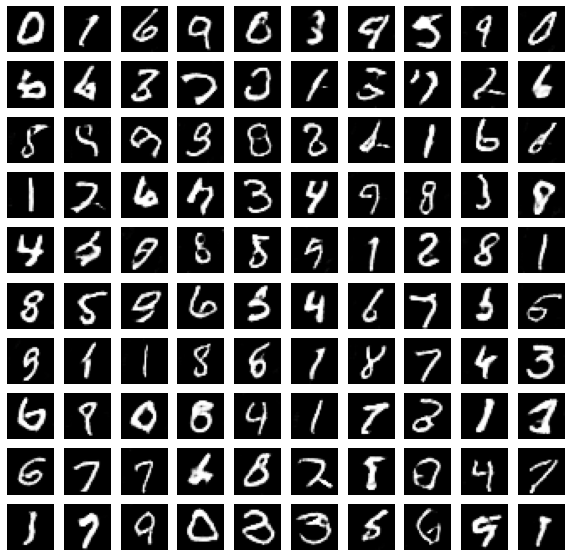

Time for epoch 49 is 14.039470195770264 sec


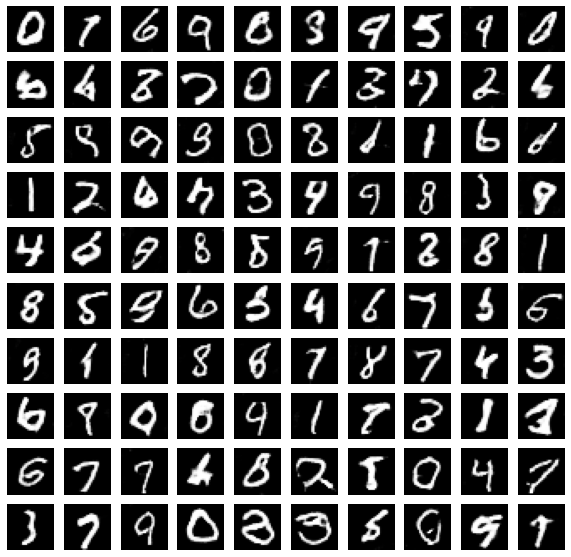

Time for epoch 50 is 14.086564064025879 sec


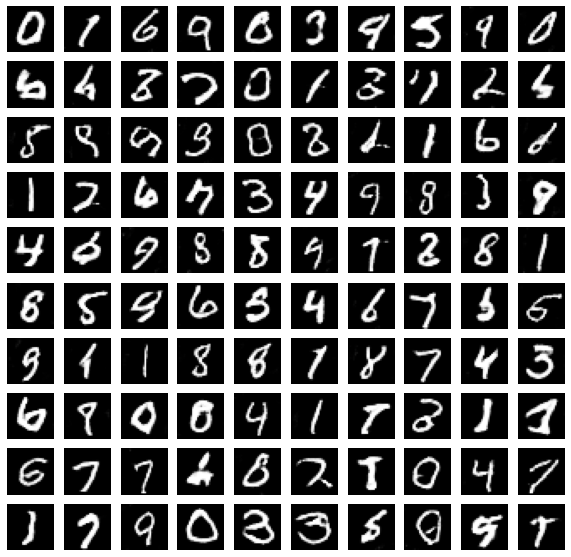

Time for epoch 51 is 14.128897190093994 sec


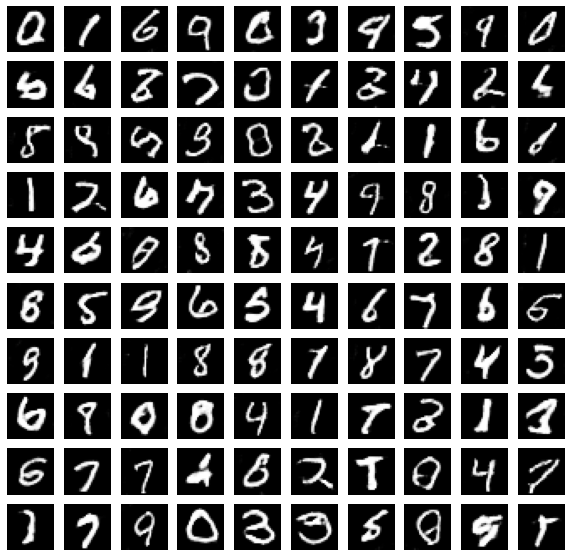

Time for epoch 52 is 13.993199110031128 sec


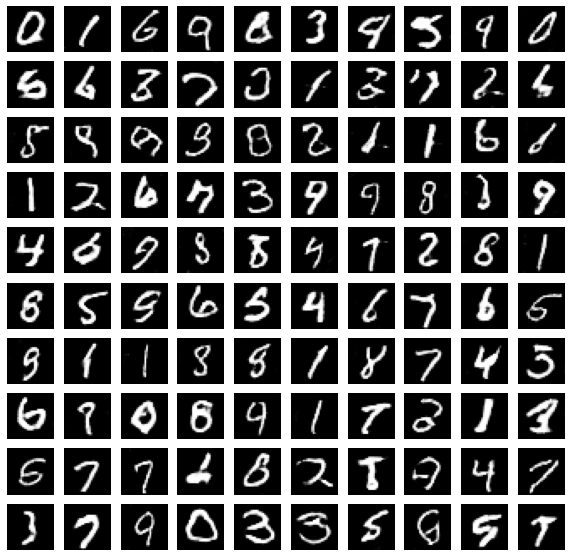

Time for epoch 53 is 14.039798974990845 sec


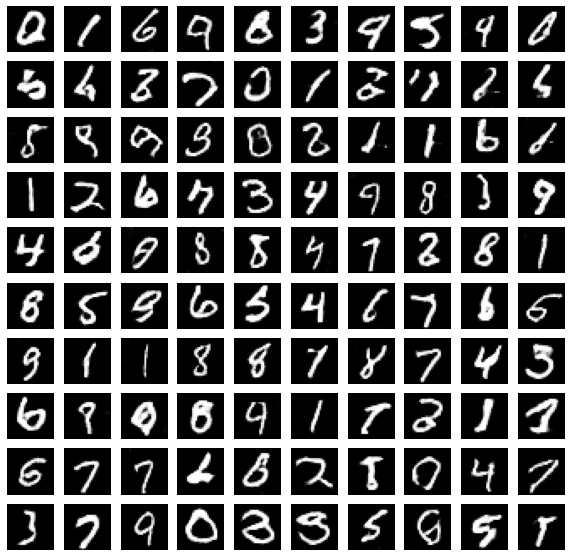

Time for epoch 54 is 14.108179330825806 sec


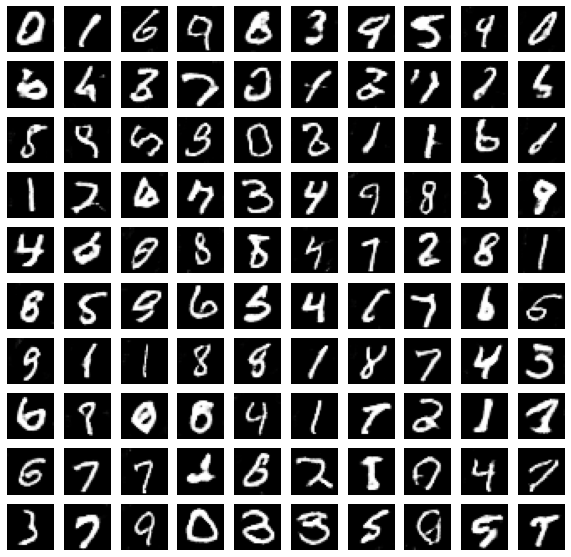

Time for epoch 55 is 13.974168300628662 sec


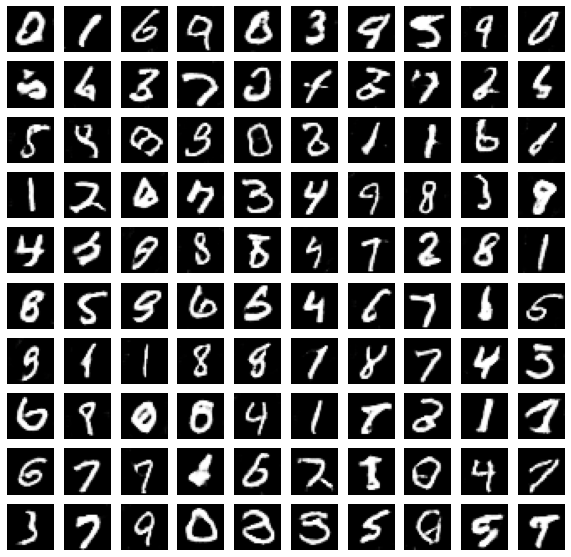

Time for epoch 56 is 14.0649733543396 sec


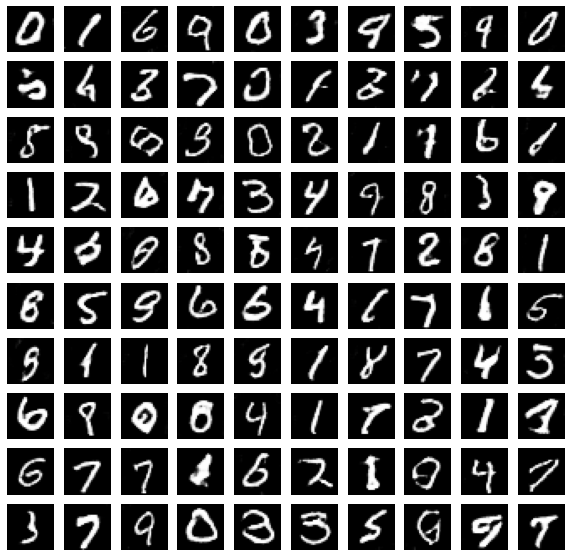

Time for epoch 57 is 14.083731651306152 sec


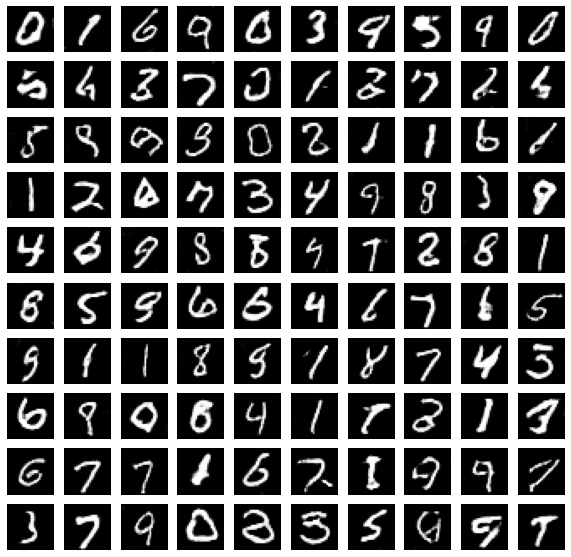

Time for epoch 58 is 14.021078824996948 sec


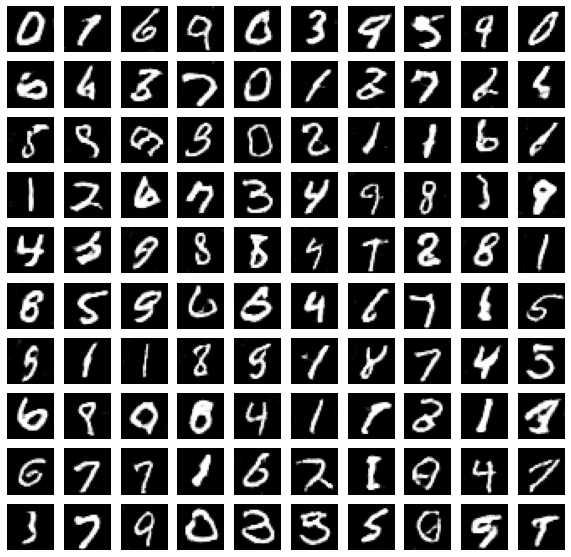

Time for epoch 59 is 14.086146593093872 sec


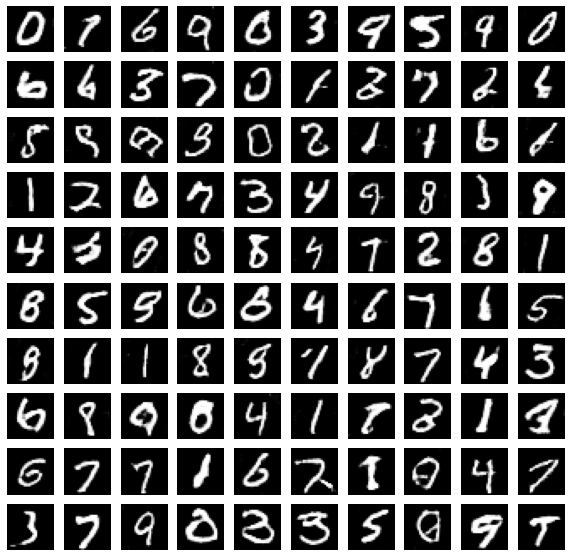

Time for epoch 60 is 14.10519003868103 sec


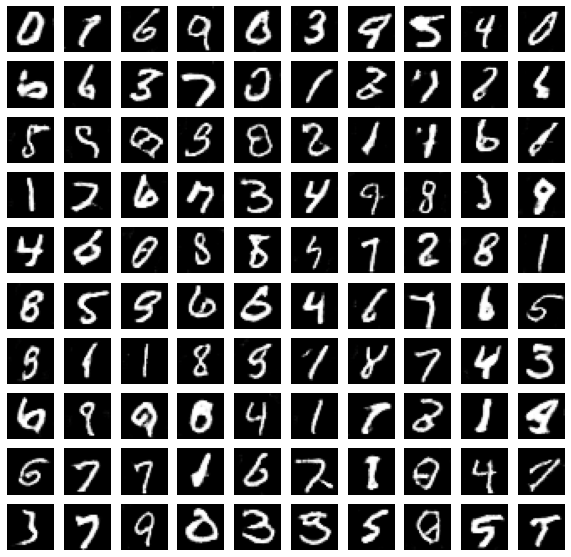

Time for epoch 61 is 13.9643075466156 sec


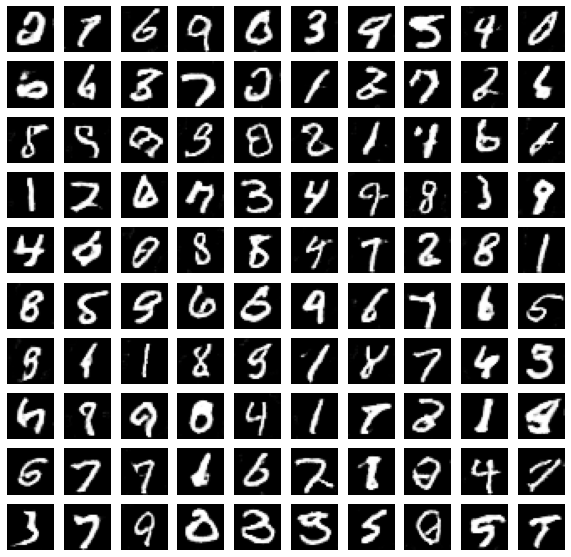

Time for epoch 62 is 14.07324481010437 sec


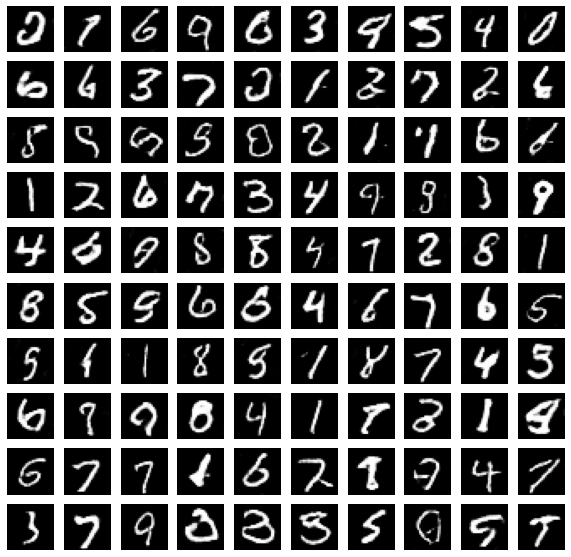

Time for epoch 63 is 14.18495488166809 sec


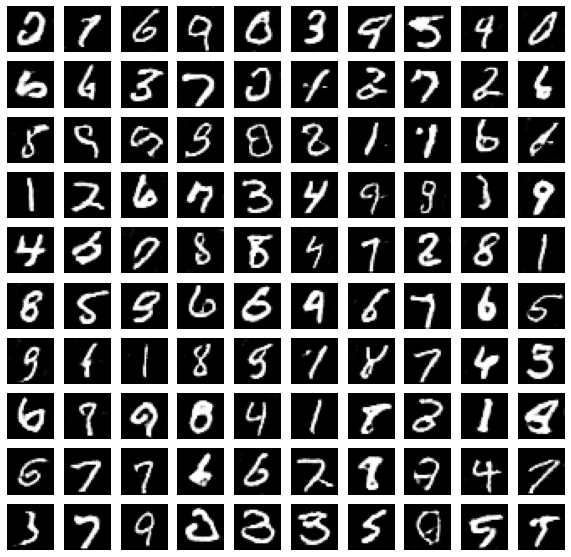

Time for epoch 64 is 13.997117042541504 sec


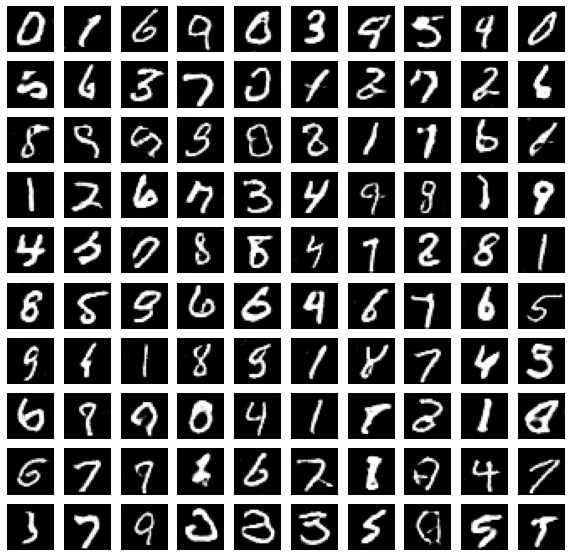

Time for epoch 65 is 14.056491613388062 sec


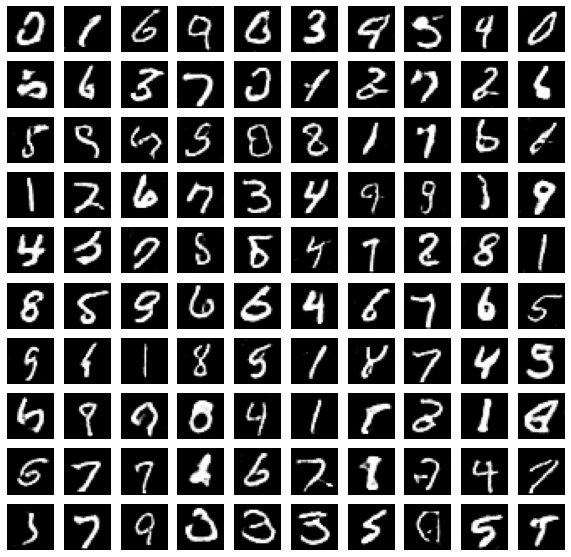

Time for epoch 66 is 14.094177722930908 sec


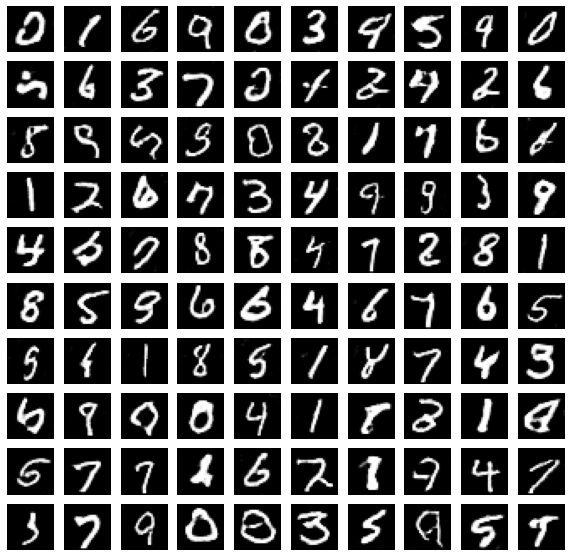

Time for epoch 67 is 13.929059505462646 sec


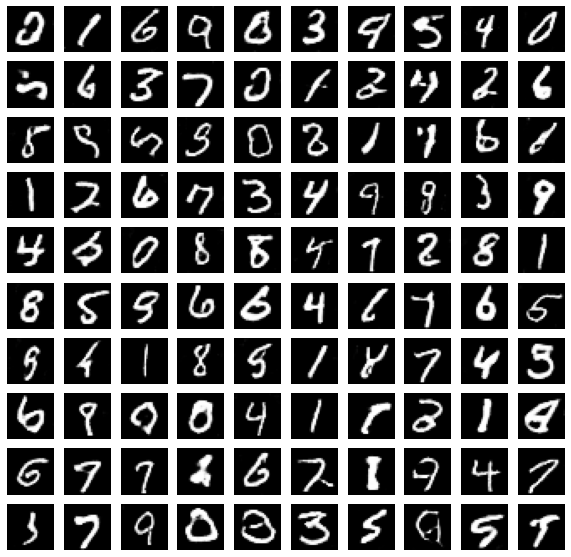

Time for epoch 68 is 14.081262111663818 sec


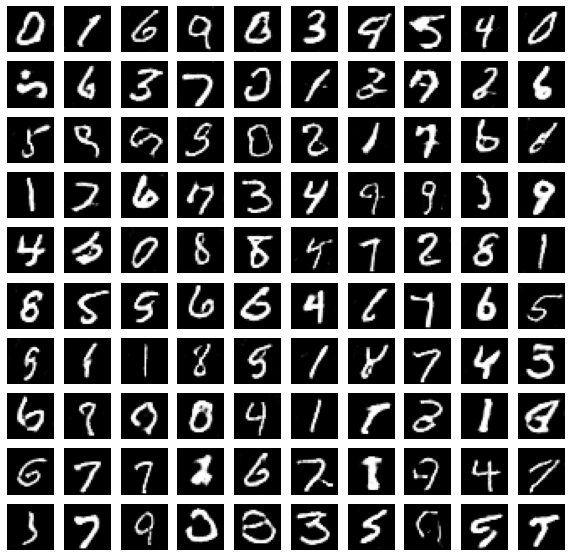

Time for epoch 69 is 14.206201314926147 sec


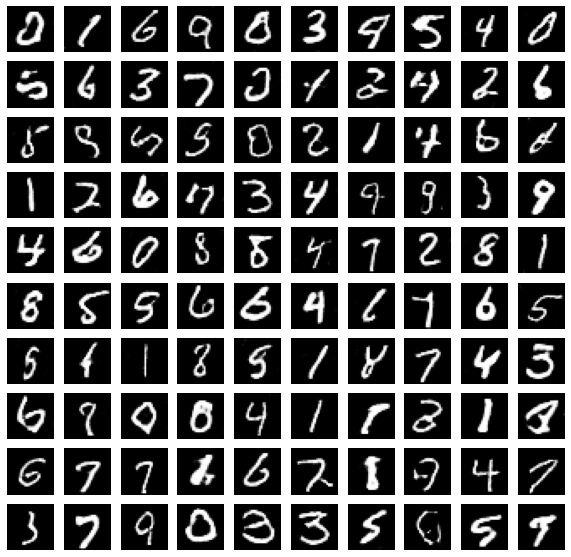

Time for epoch 70 is 14.017219543457031 sec


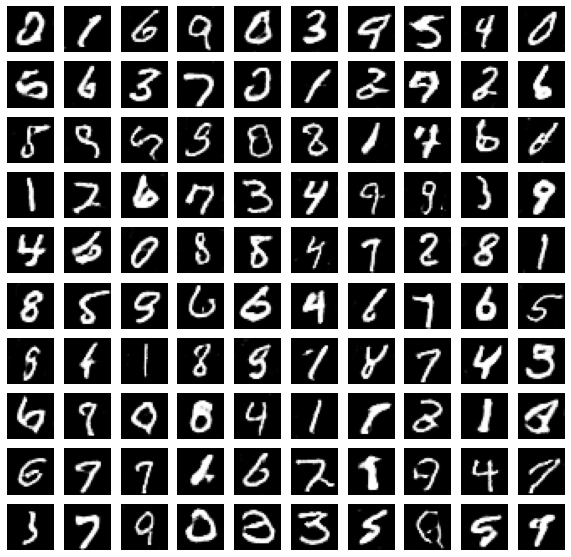

Time for epoch 71 is 14.06659984588623 sec


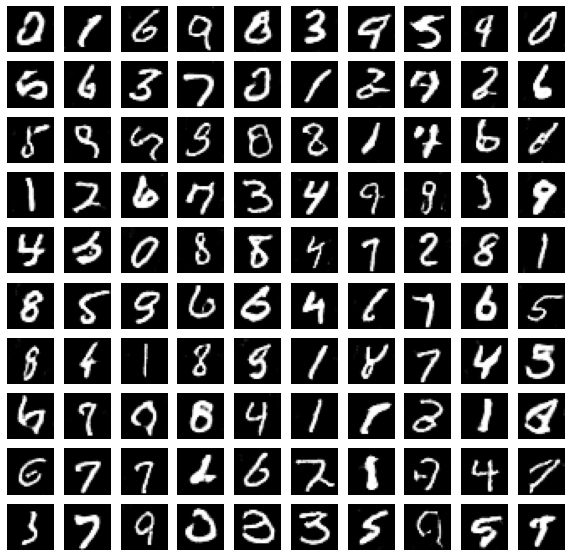

Time for epoch 72 is 14.104479789733887 sec


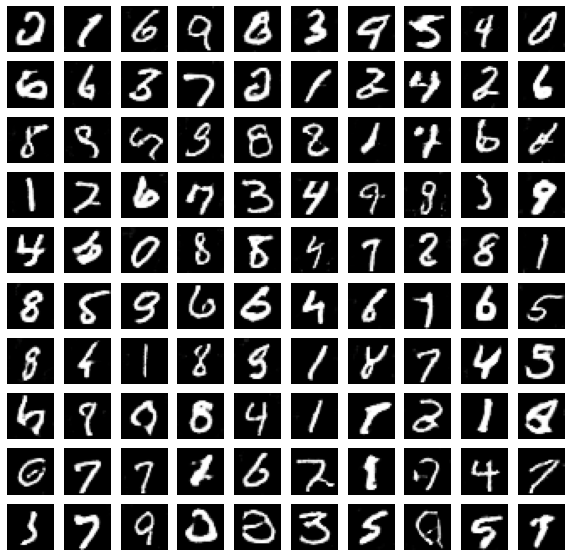

Time for epoch 73 is 14.049937725067139 sec


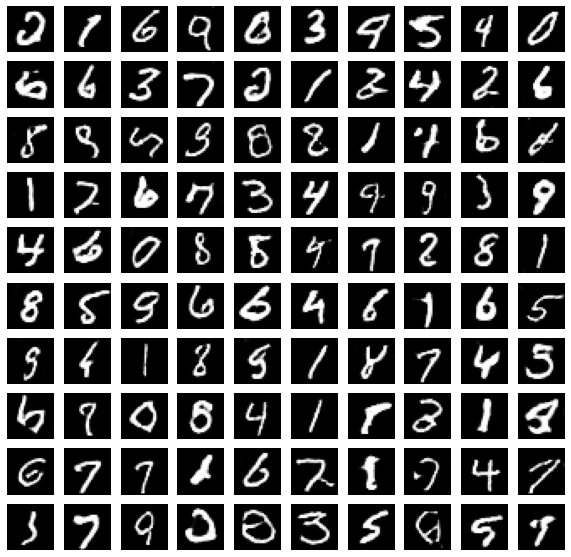

Time for epoch 74 is 14.081368446350098 sec


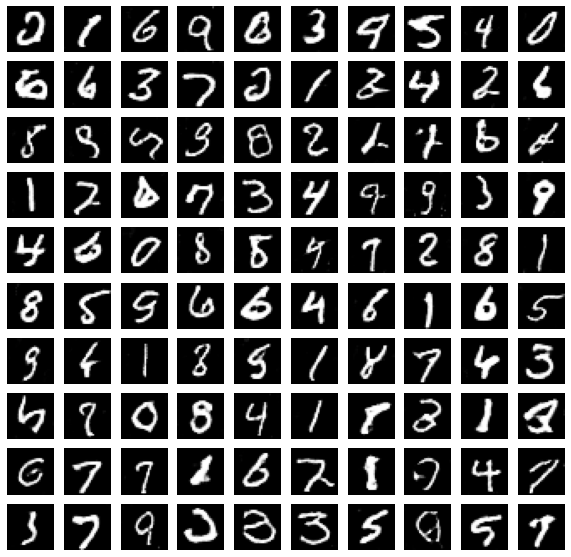

Time for epoch 75 is 14.08481240272522 sec


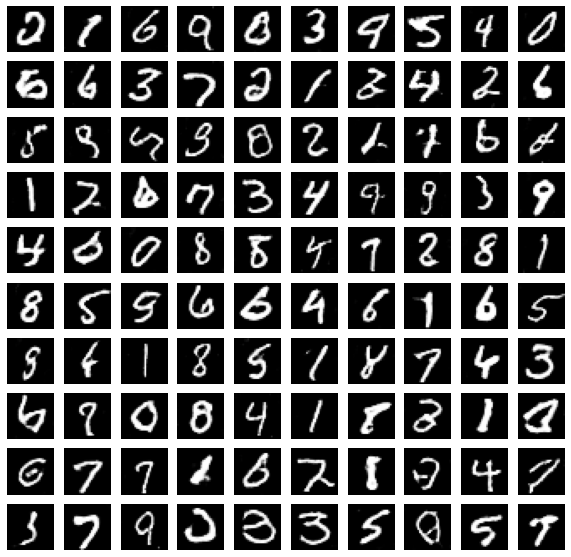

Time for epoch 76 is 14.052042722702026 sec


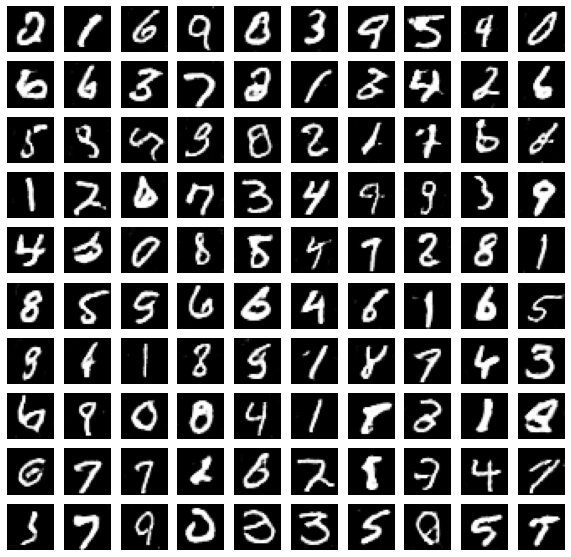

Time for epoch 77 is 14.058237314224243 sec


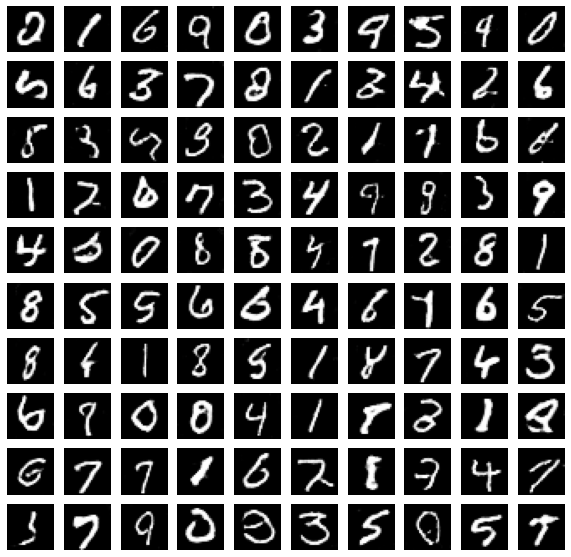

Time for epoch 78 is 14.048438310623169 sec


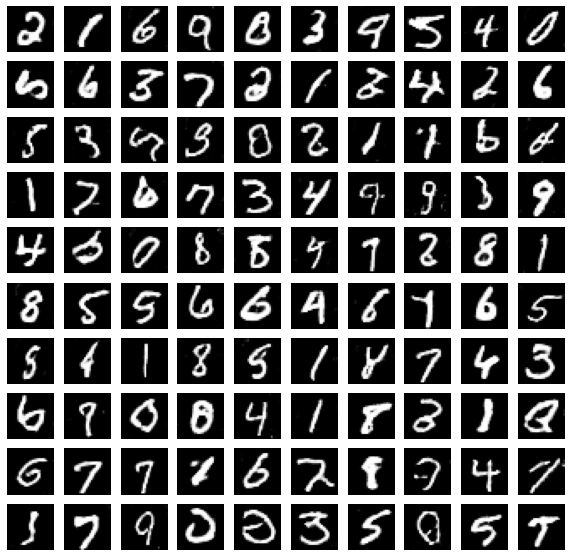

Time for epoch 79 is 13.988307237625122 sec


In [ ]:
%%time
EPOCHS = 100
train(train_dataset, EPOCHS)